<a href="https://colab.research.google.com/github/rbarkerclarke/TDAHistopathology/blob/main/deconvolute_h%26e.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [12]:
import sys
#!{sys.executable} -m pip install scikit-image
!{sys.executable} -m pip install giotto-tda
!{sys.executable} -m pip install histomicstk --find-links https://girder.github.io/large_image_wheels



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 7.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 526.4/526.4 kB 14.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 452.9/452.9 kB 16.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 21.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 31.6 MB/s eta 0:00:00


In [13]:
from matplotlib.image import pil_to_array
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
import skimage

import histomicstk as htk

from skimage import data
from skimage.color import rgb2hed, hed2rgb

from gtda.plotting import *
from gtda.homology import *

In [14]:
#Example stain vector matrix
#0.65 0.70 0.29
#0.07 0.99 0.11
#0.27 0.57 0.78

#Deconvolution matrix is the INVERSE of the stain vector matrix
#1.88 −0.07 −0.60
#−1.02 1.13 −0.48
#−0.55 −0.13 1.57

#hematoxylin
a,c,e = 1.88, -0.49, -0.66
#eosin
b,d,f = -1.05, 1.29, -0.52
#dab
i,j,k = -0.45, -0.43, 1.27

a0,b0,c0,d0,e0,f0 = a,b,c,d,e,f
hematrix = [[a,b,i],[c,d,j],[e,f,k]]
hematrix = np.array(hematrix)


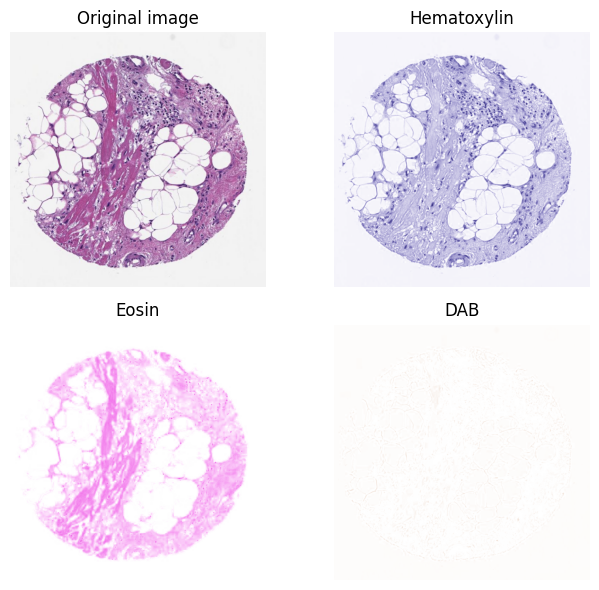

In [15]:
#hematoxylin
a,c,e = 1.88, -0.49, -0.66
#eosin
b,d,f = -1.05, 1.29, -0.52
#dab
i,j,k = -0.45, -0.43, 1.27

a1,c1,e1 = 1.88, -0.07, -0.60
b1,d1,f1 =-1.02, 1.13, -0.48

for a,b,c,d,e,f in [[a1,b1,c1,d1,e1,f1]]:

  hematrix = [[a,b,i],[c,d,j],[e,f,k]]
  hematrix = np.array(hematrix)
  # Example IHC image
  ihc_rgb = data.immunohistochemistry()
  # IHC/HE Image example
  ihc_rgb =  Image.open("0-6.jpg")

  # Display
  fig, axes = plt.subplots(2, 2, figsize=(7, 6), sharex=True, sharey=True)
  ax = axes.ravel()

  ax[0].imshow(ihc_rgb)
  # Separate the stains from the IHC image
  ihc_hed = skimage.color.separate_stains(ihc_rgb, hematrix)
  invmatrix = np.linalg.inv(hematrix)

  # Create an RGB image for each of the stains
  null = np.zeros_like(ihc_hed[:, :, 0])
  ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
  ihc_h = hed2rgb(np.stack((ihc_hed[:, :, 0], null, null), axis=-1))
  ihc_e = hed2rgb(np.stack((null, ihc_hed[:, :, 1], null), axis=-1))
  ihc_d = hed2rgb(np.stack((null, null, ihc_hed[:, :, 2]), axis=-1))



  ax[0].imshow(ihc_rgb)
  ax[0].set_title("Original image")

  ax[1].imshow(ihc_h)
  ax[1].set_title("Hematoxylin")

  ax[2].imshow(ihc_e)
  ax[2].set_title("Eosin")  # Note that there is no Eosin stain in this image

  ax[3].imshow(ihc_d)
  ax[3].set_title("DAB")

  for a in ax.ravel():
      a.axis('off')

  fig.tight_layout()


In [21]:
from __future__ import print_function

import histomicstk as htk

import numpy as np
import scipy as sp

import skimage.io
import skimage.measure
import skimage.color

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
%matplotlib inline

#Some nice default configuration for plots
plt.rcParams['figure.figsize'] = 10, 10
plt.rcParams['image.cmap'] = 'gray'
titlesize = 24

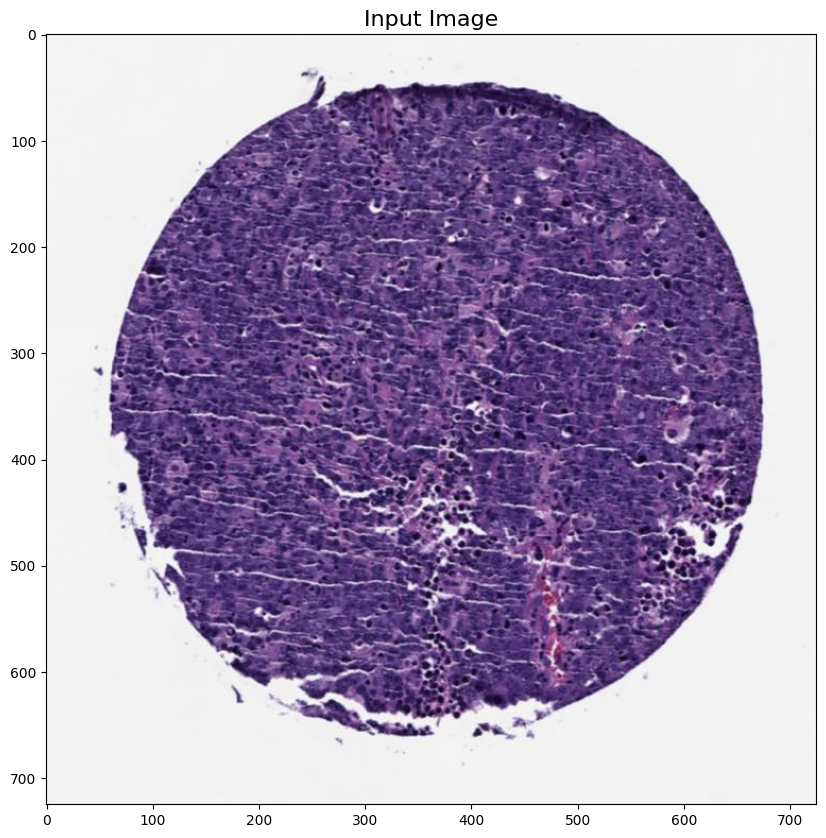

In [22]:
inputImageFile = ('0-8.jpg')  # H&E.png

imInput = skimage.io.imread(inputImageFile)[:, :, :3]

plt.imshow(imInput)
_ = plt.title('Input Image', fontsize=16)

stain_color_map:
{'hematoxylin': [0.65, 0.7, 0.29], 'eosin': [0.07, 0.99, 0.11], 'dab': [0.27, 0.57, 0.78], 'null': [0.0, 0.0, 0.0]}


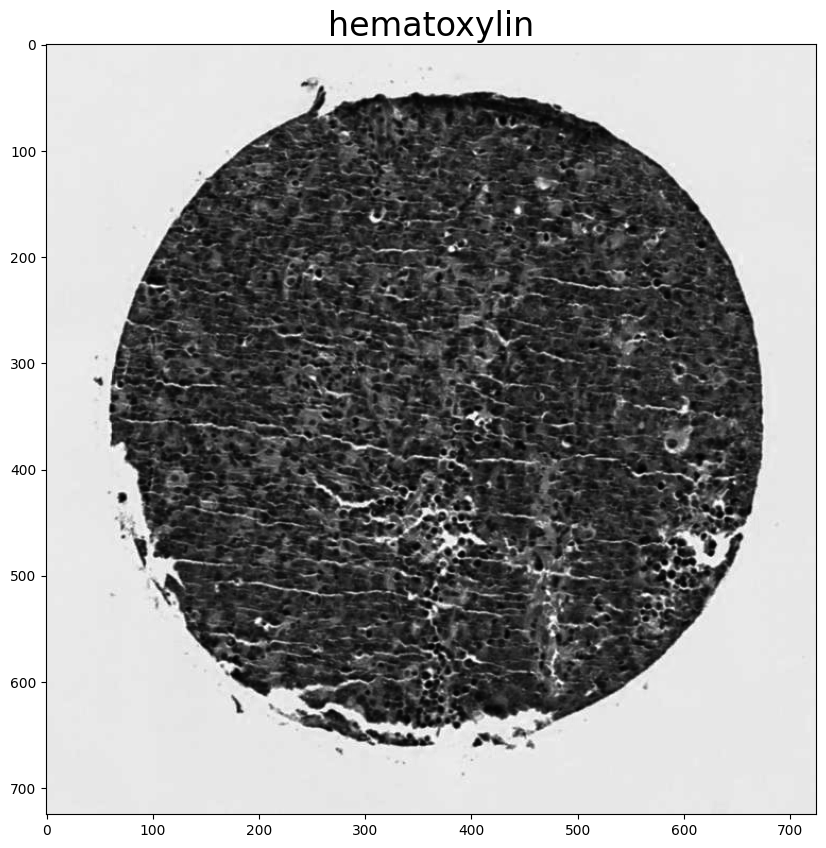

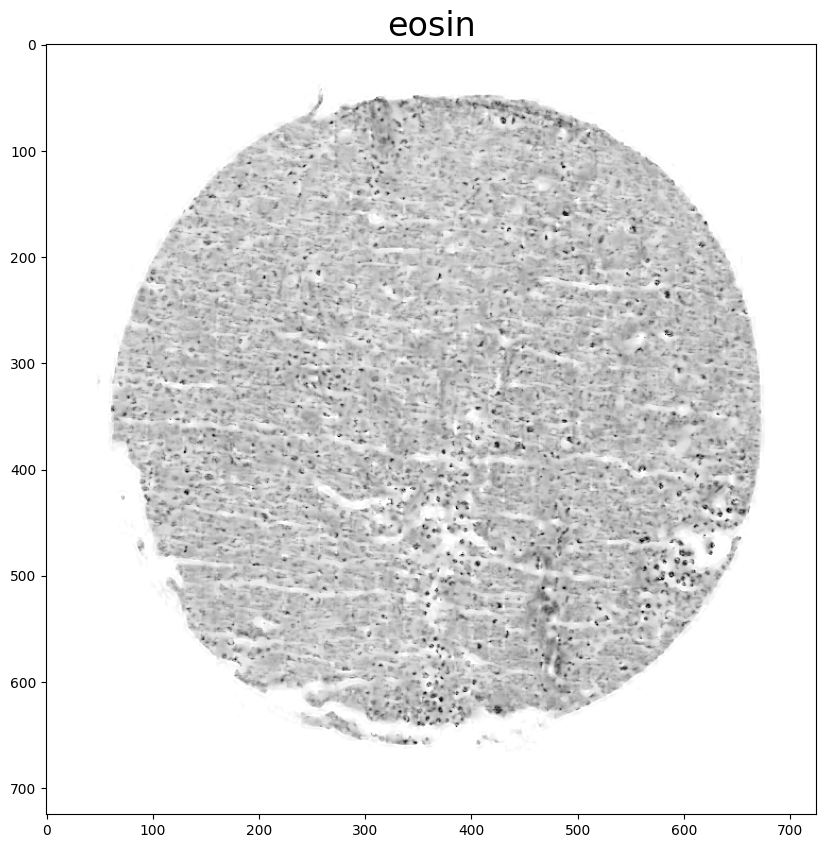

In [23]:
# create stain to color map
stain_color_map = htk.preprocessing.color_deconvolution.stain_color_map
print('stain_color_map:', stain_color_map, sep='\n')

# specify stains of input image
stains = ['hematoxylin',  # nuclei stain
          'eosin',        # cytoplasm stain
          'null']         # set to null if input contains only two stains

# create stain matrix
W = np.array([stain_color_map[st] for st in stains]).T

# perform standard color deconvolution
imDeconvolved = htk.preprocessing.color_deconvolution.color_deconvolution(imInput, W)

# Display results
for i in 0, 1:
    plt.figure()
    plt.imshow(imDeconvolved.Stains[:, :, i])
    _ = plt.title(stains[i], fontsize=titlesize)

In [24]:
# create initial stain matrix
W_init = W[:, :2]

# Compute stain matrix adaptively
sparsity_factor = 0.5

I_0 = 127
im_sda = htk.preprocessing.color_conversion.rgb_to_sda(imInput, I_0)
#W_est = htk.preprocessing.color_deconvolution.separate_stains_xu_snmf(
#    im_sda, W_init, sparsity_factor,
#)

# perform sparse color deconvolution
#imDeconvolved = htk.preprocessing.color_deconvolution.color_deconvolution(
#    imInput,
#    htk.preprocessing.color_deconvolution.complement_stain_matrix(W_est),
#    I_0,
#)

#print('Estimated stain colors (in rows):', W_est.T, sep='\n')

# Display results
#for i in 0, 1:
#    plt.figure()
#    plt.imshow(imDeconvolved.Stains[:, :, i])
#    _ = plt.title(stains[i], fontsize=titlesize)

Estimated stain colors (rows):
[[ 0.00186425  0.99998649 -0.00485291]
 [ 0.58324666  0.78202004  0.21969978]]


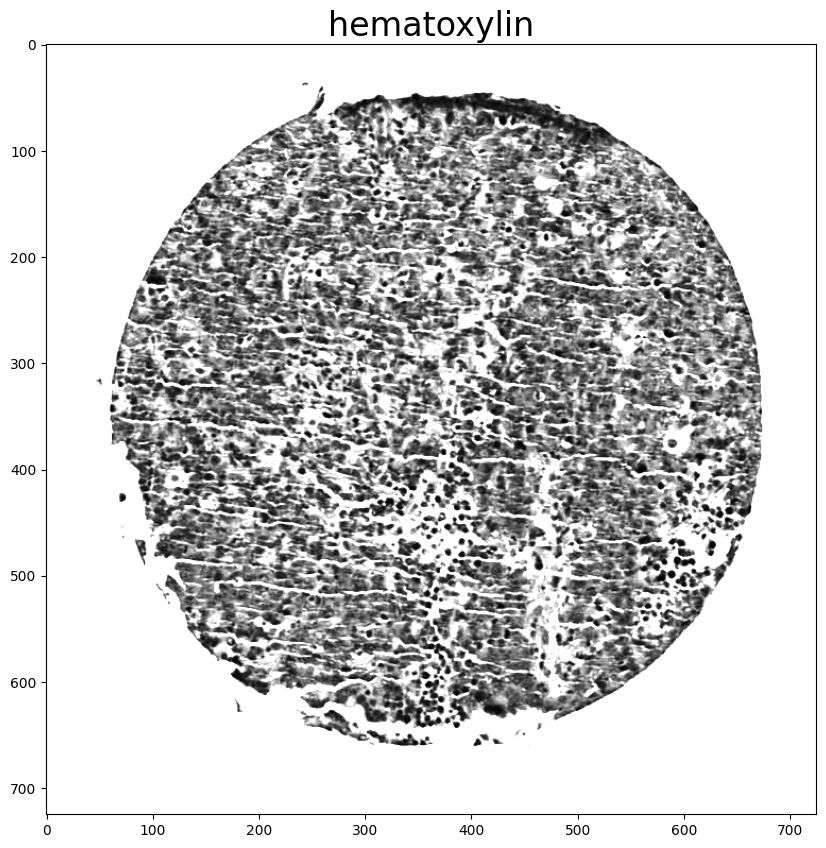

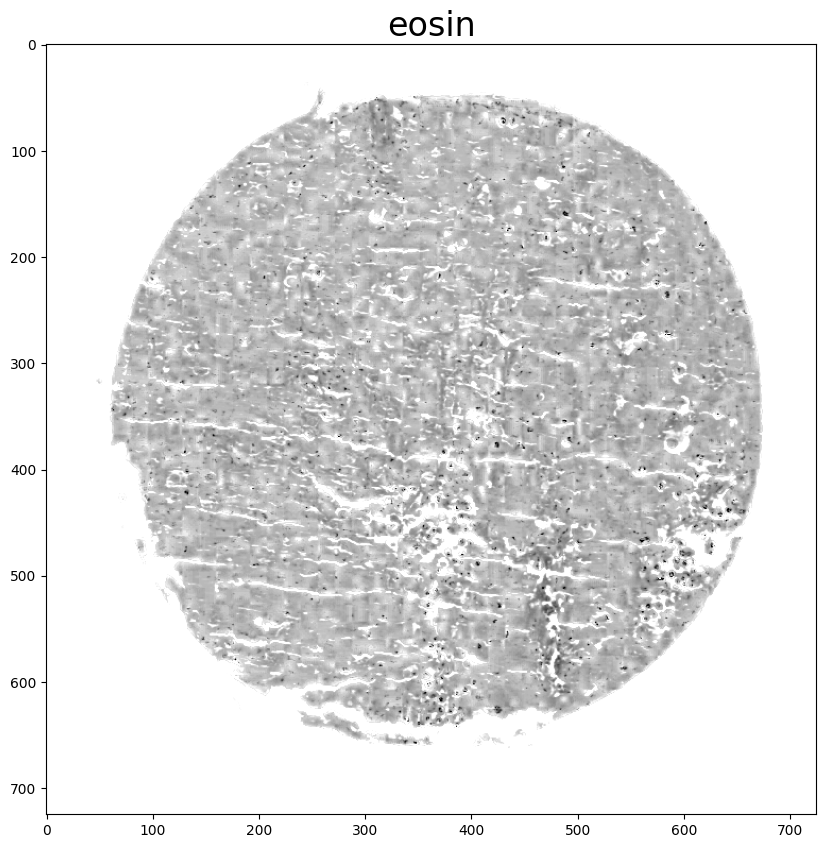

In [25]:
w_est = htk.preprocessing.color_deconvolution.rgb_separate_stains_macenko_pca(imInput, I_0)

# Perform color deconvolution
deconv_result = htk.preprocessing.color_deconvolution.color_deconvolution(imInput, w_est, I_0)

print('Estimated stain colors (rows):', w_est.T[:2], sep='\n')

# Display results
for i in 0, 1:
    plt.figure()
    # Unlike SNMF, we're not guaranteed the order of the different stains.
    # find_stain_index guesses which one we want
    channel = htk.preprocessing.color_deconvolution.find_stain_index(
        stain_color_map[stains[i]], w_est)
    plt.imshow(deconv_result.Stains[:, :, channel])
    _ = plt.title(stains[i], fontsize=titlesize)

In [27]:
cubical_persistence = CubicalPersistence(n_jobs=-1)
pd_vals = cubical_persistence.fit_transform([deconv_result.Stains[:,:,0]])
cubical_persistence.plot(pd_vals)

In [28]:
cubical_persistence = CubicalPersistence(n_jobs=-1)
pd_vals = cubical_persistence.fit_transform([deconv_result.Stains[:,:,1]])
cubical_persistence.plot(pd_vals)

stain_color_map:
{'hematoxylin': [0.65, 0.7, 0.29], 'eosin': [0.07, 0.99, 0.11], 'dab': [0.27, 0.57, 0.78], 'null': [0.0, 0.0, 0.0]}


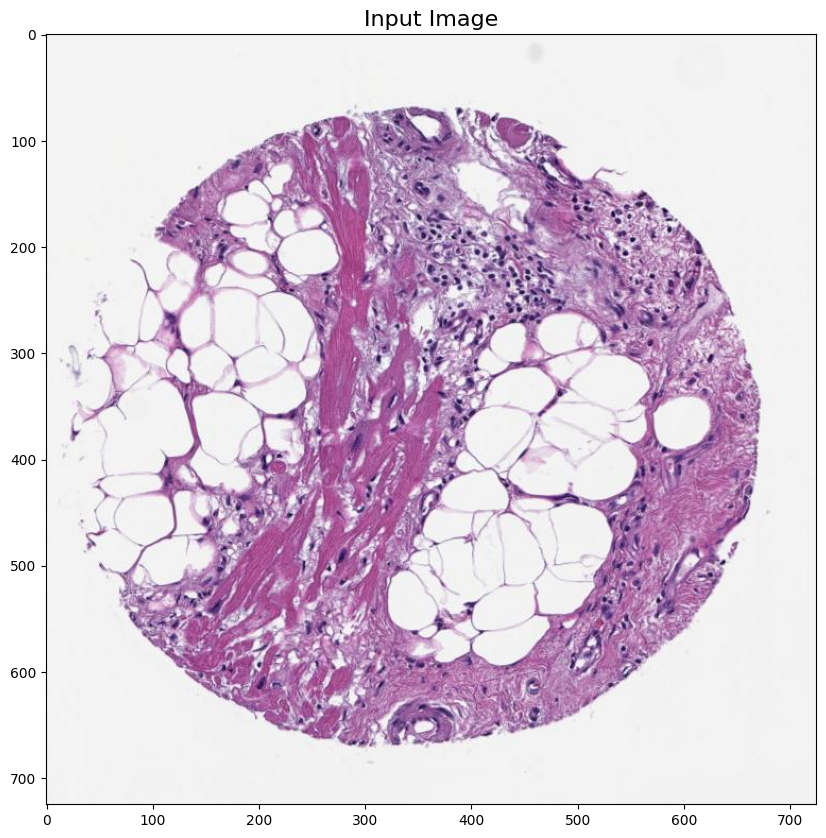

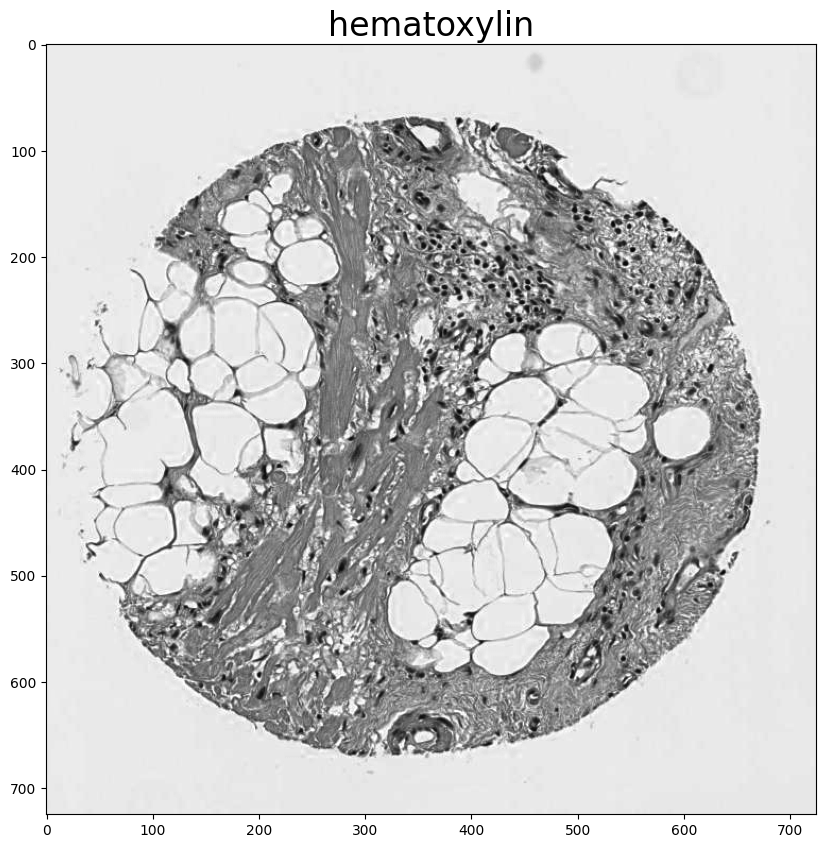

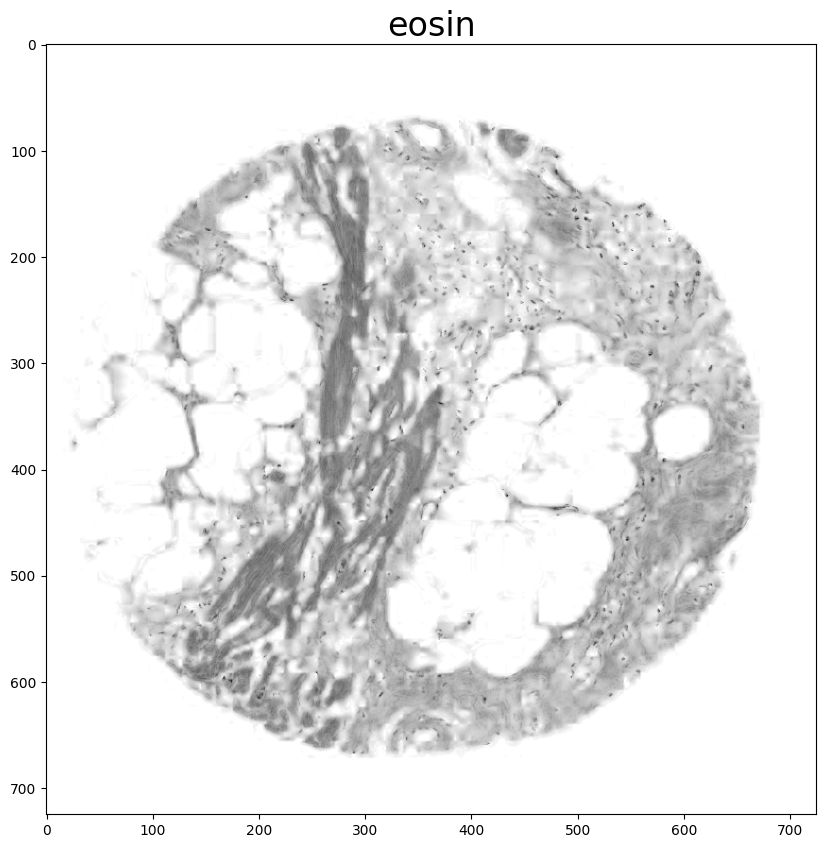

In [29]:
inputImageFile = ('0-6.jpg')  # H&E.png

imInput = skimage.io.imread(inputImageFile)[:, :, :3]

plt.imshow(imInput)
_ = plt.title('Input Image', fontsize=16)

# create stain to color map
stain_color_map = htk.preprocessing.color_deconvolution.stain_color_map
print('stain_color_map:', stain_color_map, sep='\n')

# specify stains of input image
stains = ['hematoxylin',  # nuclei stain
          'eosin',        # cytoplasm stain
          'null']         # set to null if input contains only two stains

# create stain matrix
W = np.array([stain_color_map[st] for st in stains]).T

# perform standard color deconvolution
imDeconvolved = htk.preprocessing.color_deconvolution.color_deconvolution(imInput, W)

# Display results
for i in 0, 1:
    plt.figure()
    plt.imshow(imDeconvolved.Stains[:, :, i])
    _ = plt.title(stains[i], fontsize=titlesize)

    # create initial stain matrix
W_init = W[:, :2]

# Compute stain matrix adaptively
sparsity_factor = 0.5

I_0 = 127
im_sda = htk.preprocessing.color_conversion.rgb_to_sda(imInput, I_0)
#W_est = htk.preprocessing.color_deconvolution.separate_stains_xu_snmf(
#    im_sda, W_init, sparsity_factor,
#)

# perform sparse color deconvolution
#imDeconvolved = htk.preprocessing.color_deconvolution.color_deconvolution(
#    imInput,
#    htk.preprocessing.color_deconvolution.complement_stain_matrix(W_est),
#    I_0,
#)

#print('Estimated stain colors (in rows):', W_est.T, sep='\n')

# Display results
#for i in 0, 1:
#    plt.figure()
#    plt.imshow(imDeconvolved.Stains[:, :, i])
#    _ = plt.title(stains[i], fontsize=titlesize)

In [32]:
cubical_persistence = CubicalPersistence(n_jobs=-1)
pd_vals = cubical_persistence.fit_transform([deconv_result.Stains[:,:,0]])
cubical_persistence.plot(pd_vals)


In [33]:

cubical_persistence = CubicalPersistence(n_jobs=-1)
pd_vals = cubical_persistence.fit_transform([deconv_result.Stains[:,:,1]])
cubical_persistence.plot(pd_vals)